In [1]:
import pandas as pd
import numpy as np

# import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import json 

#plot confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
# import stratified k fold
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_auc_score, fbeta_score
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier


from xgboost import XGBClassifier
import re


import statistics


from sklearn.model_selection import GridSearchCV

# import RepeatedStratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold



from sklearn.metrics import make_scorer







In [2]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

# Load the Dataset

In [3]:
df = pandas = pd.read_csv('../German_Credit_data/Data/german.data', sep=' ')
df

,A11,6,A34,A43,1169,A65,A75,4,A93,A101,...,A121,67,A143,A152,2,A173,1,A192,A201,1.1
0,A12,48,A32,A43,5951,A61,A73,2,A92,A101,...,A121,22,A143,A152,1,A173,1,A191,A201,2
1,A14,12,A34,A46,2096,A61,A74,2,A93,A101,...,A121,49,A143,A152,1,A172,2,A191,A201,1
2,A11,42,A32,A42,7882,A61,A74,2,A93,A103,...,A122,45,A143,A153,1,A173,2,A191,A201,1
3,A11,24,A33,A40,4870,A61,A73,3,A93,A101,...,A124,53,A143,A153,2,A173,2,A191,A201,2
4,A14,36,A32,A46,9055,A65,A73,2,A93,A101,...,A124,35,A143,A153,1,A172,2,A192,A201,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,A14,12,A32,A42,1736,A61,A74,3,A92,A101,...,A121,31,A143,A152,1,A172,1,A191,A201,1
995,A11,30,A32,A41,3857,A61,A73,4,A91,A101,...,A122,40,A143,A152,1,A174,1,A192,A201,1
996,A14,12,A32,A43,804,A61,A75,4,A93,A101,...,A123,38,A143,A152,1,A173,1,A191,A201,1
997,A11,45,A32,A43,1845,A61,A73,4,A93,A101,...,A124,23,A143,A153,1,A173,1,A192,A201,2


# Da die Attributsnamen kodiert sind werden diese zu erst mithilfe der zugehörigen Dokumentation ersetzt. (Siehe Categorical.json)


In [4]:
file_path = "../German_Credit_data/Data/german.data"

names = ['Status Checking', 'Duration in Month', 'Credit History', 'Purpose', 'Credit Amount', 
         'Savings Account', 'Employement since', 'Installmentrate %', 'StatusSex', 'Other debtors', 
         'PresentResidence', 'Property', 'Age in years', 'Otherinstallment Plans', 'Housing', 
         'Number existing Credits', 'Job', 'Number people liable', 'Telephone', 'Foreign Worker', 'Target']
german_data = pd.read_csv(file_path,names=names,delim_whitespace=True, header=None)
catgories = open('../German_Credit_data/Data/categorical.json')
json_data = json.load(catgories)
json_data
for h in names:
    if h in json_data:
        german_data[h] = german_data[h].map(json_data[h])

In [5]:
german_data.head(10)

,Status Checking,Duration in Month,Credit History,Purpose,Credit Amount,Savings Account,Employement since,Installmentrate %,StatusSex,Other debtors,...,Property,Age in years,Otherinstallment Plans,Housing,Number existing Credits,Job,Number people liable,Telephone,Foreign Worker,Target
0,less than 0 DM,6,critical account / other credits existing (not...,radio/television,1169,unknown / no savings account,bigger than or equal 7 years,4,male : single,None,...,real estate,67,None,own,2,skilled employee /official,1,"yes, registered under the customers name",yes,1
1,0 less than or equal and less than 200 DM,48,existing credits paind back duly till now,radio/television,5951,less than 100DM,1 less than or equal and less than 4 years,2,female : divorced/separated/married,None,...,real estate,22,None,own,1,skilled employee /official,1,None,yes,2
2,no checking account,12,critical account / other credits existing (not...,education,2096,less than 100DM,4 less than and equal and less than 7 years,2,male : single,None,...,real estate,49,None,own,1,unskilled-resident,2,None,yes,1
3,less than 0 DM,42,existing credits paind back duly till now,furniture/equipment,7882,less than 100DM,4 less than and equal and less than 7 years,2,male : single,guarantor,...,if not real estate : building society savings ...,45,None,for free,1,skilled employee /official,2,None,yes,1
4,less than 0 DM,24,delay in paying off in the past,car (new),4870,less than 100DM,1 less than or equal and less than 4 years,3,male : single,None,...,unknown/no property,53,None,for free,2,skilled employee /official,2,None,yes,2
5,no checking account,36,existing credits paind back duly till now,education,9055,unknown / no savings account,1 less than or equal and less than 4 years,2,male : single,None,...,unknown/no property,35,None,for free,1,unskilled-resident,2,"yes, registered under the customers name",yes,1
6,no checking account,24,existing credits paind back duly till now,furniture/equipment,2835,500 less than or equal and 1000 DM,bigger than or equal 7 years,3,male : single,None,...,if not real estate : building society savings ...,53,None,own,1,skilled employee /official,1,None,yes,1
7,0 less than or equal and less than 200 DM,36,existing credits paind back duly till now,car (used),6948,less than 100DM,1 less than or equal and less than 4 years,2,male : single,None,...,"if not others options : car or other, not in s...",35,None,rent,1,management/self-employed/highly qualified empl...,1,"yes, registered under the customers name",yes,1
8,no checking account,12,existing credits paind back duly till now,radio/television,3059,bigger than or equal 1000 DM,4 less than and equal and less than 7 years,2,male : divorced/separated,None,...,real estate,61,None,own,1,unskilled-resident,1,None,yes,1
9,0 less than or equal and less than 200 DM,30,critical account / other credits existing (not...,car (new),5234,less than 100DM,unemployed,4,male : married/windowed,None,...,"if not others options : car or other, not in s...",28,None,own,2,management/self-employed/highly qualified empl...,1,None,yes,2


In [6]:
# Statistische Daten zur Datenanalyse
german_data.describe()

,Duration in Month,Credit Amount,Installmentrate %,PresentResidence,Age in years,Number existing Credits,Number people liable,Target
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,2.845000,35.546000,1.407000,1.155000,1.300000
std,12.058814,2822.736876,1.118715,1.103718,11.375469,0.577654,0.362086,0.458487
min,4.000000,250.000000,1.000000,1.000000,19.000000,1.000000,1.000000,1.000000
25%,12.000000,1365.500000,2.000000,2.000000,27.000000,1.000000,1.000000,1.000000
50%,18.000000,2319.500000,3.000000,3.000000,33.000000,1.000000,1.000000,1.000000
75%,24.000000,3972.250000,4.000000,4.000000,42.000000,2.000000,1.000000,2.000000
max,72.000000,18424.000000,4.000000,4.000000,75.000000,4.000000,2.000000,2.000000


In [7]:
german_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Status Checking          1000 non-null   object
 1   Duration in Month        1000 non-null   int64 
 2   Credit History           1000 non-null   object
 3   Purpose                  1000 non-null   object
 4   Credit Amount            1000 non-null   int64 
 5   Savings Account          1000 non-null   object
 6   Employement since        1000 non-null   object
 7   Installmentrate %        1000 non-null   int64 
 8   StatusSex                1000 non-null   object
 9   Other debtors            1000 non-null   object
 10  PresentResidence         1000 non-null   int64 
 11  Property                 1000 non-null   object
 12  Age in years             1000 non-null   int64 
 13  Otherinstallment Plans   1000 non-null   object
 14  Housing                  1000 non-null   

In [8]:
#import dataframe_image as dfi
#german_data.head(5).dfi.export('df.png')
#df_styled = german_data.describe().style.background_gradient()
# describe the data
#dfi.export(df_styled, 'df_stats.png')

In [9]:
# check for missing values
german_data.isnull().sum()


Status Checking            0
Duration in Month          0
Credit History             0
Purpose                    0
Credit Amount              0
Savings Account            0
Employement since          0
Installmentrate %          0
StatusSex                  0
Other debtors              0
PresentResidence           0
Property                   0
Age in years               0
Otherinstallment Plans     0
Housing                    0
Number existing Credits    0
Job                        0
Number people liable       0
Telephone                  0
Foreign Worker             0
Target                     0
dtype: int64

# Prüfung der Daten auf Plausibilität und Allgemeine Datenanalyse

<AxesSubplot:>

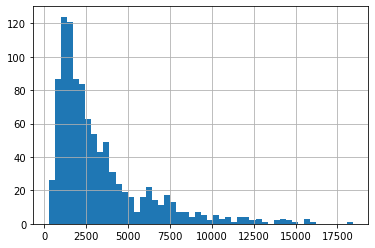

In [10]:
#check credit amount for outliers
german_data['Credit Amount'].hist(bins=50)




<AxesSubplot:ylabel='Frequency'>

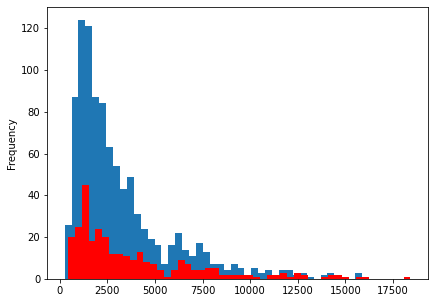

In [11]:
plt.subplot(1, 2, 1)
german_data['Credit Amount'].plot(kind='hist', logx=False, bins=50)
# plot histogram credit amout where target is 2
german_data.loc[german_data['Target'] == 2, 'Credit Amount'].plot(kind='hist', logx=False, bins=50, color='red', figsize=(15, 5))


<AxesSubplot:ylabel='Target'>

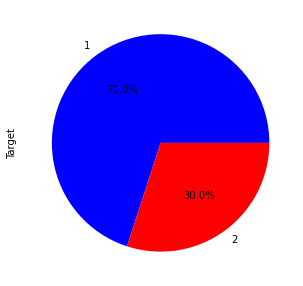

In [12]:
# plot target variable as pie chart with target 1 and target 2 as labels colored red and blue

german_data['Target'].value_counts().plot(kind='pie', colors=['blue', 'red'], autopct='%1.1f%%', figsize=(15, 5))

<AxesSubplot:xlabel='Duration in Month', ylabel='Count'>

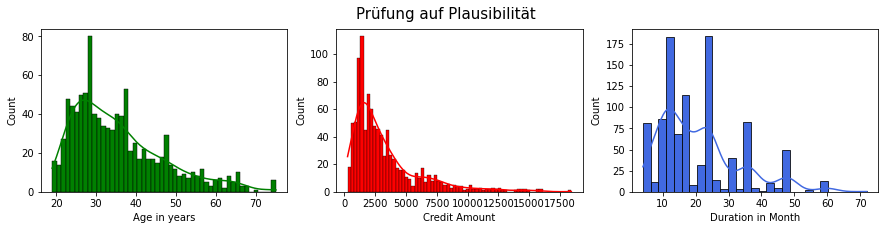

In [13]:
##subplot of numeric features
fig, axes = plt.subplots(1, 3, figsize=(15, 3), sharey=False)
fig.suptitle('Prüfung auf Plausibilität', size=15)

##Credit Amount distribution
sns.histplot(data=german_data,ax=axes[1], x="Credit Amount", kde=True, color='red', bins=70,alpha=1)

##Age distribution
sns.histplot(data=german_data, ax=axes[0],x="Age in years", kde=True, color='green', bins=50,alpha=1)

##Credit Duration distribution
sns.histplot(data=german_data, ax=axes[2],x="Duration in Month", kde=True, color='royalblue',alpha=1)

<AxesSubplot:xlabel='Duration in Month', ylabel='Credit Amount'>

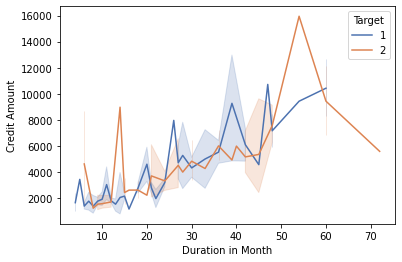

In [14]:
# Relationship between credit amount and duration of the loan
sns.lineplot(data=german_data, x='Duration in Month', y='Credit Amount', hue='Target', palette='deep')

# Zielvariable ist Ungleichverteilt

# Untersuchung auf Outlier

<AxesSubplot:title={'center':'Credit Amount'}, xlabel='Target'>

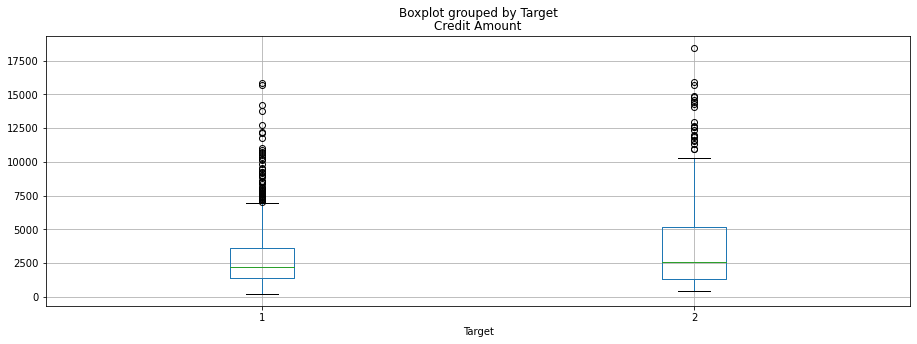

In [15]:
#box plot credit amount outliers
german_data.boxplot(column='Credit Amount', by='Target', figsize=(15, 5))

<AxesSubplot:xlabel='Credit Amount', ylabel='Target'>

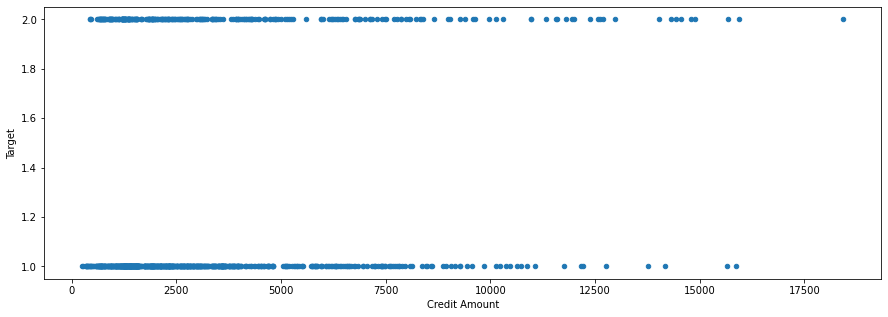

In [16]:
# scatter plot credit amount
german_data.plot(kind='scatter', x='Credit Amount', y='Target', figsize=(15, 5))

<AxesSubplot:>

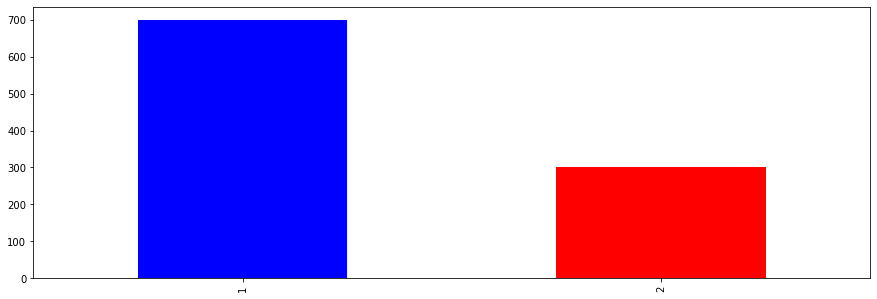

In [17]:
# plot distribution of target variable with color 2 as red and color 1 as blue

german_data['Target'].value_counts().plot(kind='bar', figsize=(15, 5), color=['blue', 'red'])

## Outlier Analysis
Um zu bewerten, ob der Datensatz ein bestimmtes maß an Außreißern beinhaltet wird der Z-Score verwendet

<AxesSubplot:ylabel='Frequency'>

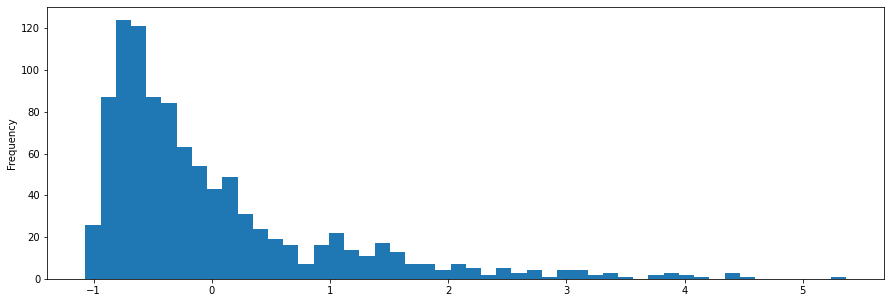

In [18]:
# calculate ZScore for credit amount --> for outlier detection
german_data['ZScore'] = (german_data['Credit Amount'] - german_data['Credit Amount'].mean()) / german_data['Credit Amount'].std()
#plot zscore for credit amount
german_data['ZScore'].plot(kind='hist', bins=50, figsize=(15, 5))

In [19]:
# calculate IQR for credit amount
def outlier_detection(df):
    Q1 = np.percentile(german_data['Credit Amount'], 25,
                    interpolation = 'midpoint')
    
    Q3 = np.percentile(german_data['Credit Amount'], 75,
                    interpolation = 'midpoint')
    IQR = Q3 - Q1

    upper = Q3 +1.5*IQR
    lower = Q1 - 1.5*IQR
    upper = german_data['Credit Amount'] >= (Q3+1.5*IQR)
    
    print("Upper bound:",upper)
    print(np.where(upper))
    
    # Below Lower bound
    lower = german_data['Credit Amount'] <= (Q1-1.5*IQR)
    print("Lower bound:", lower)
    print(np.where(lower))
outlier_detection(german_data)

# remove outliers from credit amount based on zscore
german_data = german_data.loc[(german_data['ZScore'] < 3) & (german_data['ZScore'] > -3)]


Upper bound: 0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Name: Credit Amount, Length: 1000, dtype: bool
(array([  5,  17,  18,  57,  63,  70,  78,  87,  95, 105, 130, 134, 136,
       180, 205, 226, 236, 268, 272, 274, 285, 291, 295, 304, 333, 373,
       374, 378, 381, 395, 402, 417, 431, 450, 491, 496, 509, 525, 549,
       563, 615, 616, 637, 645, 653, 657, 672, 684, 714, 736, 744, 763,
       771, 805, 808, 812, 818, 828, 832, 854, 881, 887, 895, 902, 915,
       917, 921, 927, 945, 953, 980, 983], dtype=int64),)
Lower bound: 0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Name: Credit Amount, Length: 1000, dtype: bool
(array([], dtype=int64),)


In [20]:
german_data

,Status Checking,Duration in Month,Credit History,Purpose,Credit Amount,Savings Account,Employement since,Installmentrate %,StatusSex,Other debtors,...,Age in years,Otherinstallment Plans,Housing,Number existing Credits,Job,Number people liable,Telephone,Foreign Worker,Target,ZScore
0,less than 0 DM,6,critical account / other credits existing (not...,radio/television,1169,unknown / no savings account,bigger than or equal 7 years,4,male : single,None,...,67,None,own,2,skilled employee /official,1,"yes, registered under the customers name",yes,1,-0.744759
1,0 less than or equal and less than 200 DM,48,existing credits paind back duly till now,radio/television,5951,less than 100DM,1 less than or equal and less than 4 years,2,female : divorced/separated/married,None,...,22,None,own,1,skilled employee /official,1,None,yes,2,0.949342
2,no checking account,12,critical account / other credits existing (not...,education,2096,less than 100DM,4 less than and equal and less than 7 years,2,male : single,None,...,49,None,own,1,unskilled-resident,2,None,yes,1,-0.416354
3,less than 0 DM,42,existing credits paind back duly till now,furniture/equipment,7882,less than 100DM,4 less than and equal and less than 7 years,2,male : single,guarantor,...,45,None,for free,1,skilled employee /official,2,None,yes,1,1.633430
4,less than 0 DM,24,delay in paying off in the past,car (new),4870,less than 100DM,1 less than or equal and less than 4 years,3,male : single,None,...,53,None,for free,2,skilled employee /official,2,None,yes,2,0.566380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,no checking account,12,existing credits paind back duly till now,furniture/equipment,1736,less than 100DM,4 less than and equal and less than 7 years,3,female : divorced/separated/married,None,...,31,None,own,1,unskilled-resident,1,None,yes,1,-0.543890
996,less than 0 DM,30,existing credits paind back duly till now,car (used),3857,less than 100DM,1 less than or equal and less than 4 years,4,male : divorced/separated,None,...,40,None,own,1,management/self-employed/highly qualified empl...,1,"yes, registered under the customers name",yes,1,0.207509
997,no checking account,12,existing credits paind back duly till now,radio/television,804,less than 100DM,bigger than or equal 7 years,4,male : single,None,...,38,None,own,1,skilled employee /official,1,None,yes,1,-0.874066
998,less than 0 DM,45,existing credits paind back duly till now,radio/television,1845,less than 100DM,1 less than or equal and less than 4 years,4,male : single,None,...,23,None,for free,1,skilled employee /official,1,"yes, registered under the customers name",yes,2,-0.505275


In [21]:
# function to determine outlier values
def outlier_iqr(df):
    quartile_1, quartile_3 = np.percentile(df, [25, 75])
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * 1.5)
    upper_bound = quartile_3 + (iqr * 1.5)
    return np.where((df > upper_bound) | (df < lower_bound))
# calculate the outlier values
outlier_iqr(german_data['Credit Amount'])

(array([  3,   5,  17,  56,  68,  76, 103, 108, 125, 129, 131, 148, 175,
        200, 221, 222, 262, 277, 279, 283, 286, 287, 296, 325, 365, 389,
        404, 418, 437, 478, 483, 496, 512, 525, 536, 601, 629, 637, 641,
        656, 668, 698, 719, 752, 786, 789, 793, 808, 833, 849, 859, 860,
        867, 873, 880, 902, 920, 928, 955, 958], dtype=int64),)

# Datenanalyse

In [22]:
# transform target value 2 to 1 and 1 to 0 to be binary
# 0 = good credit ; 1 = bad credit
german_data['Target'] = german_data['Target'].map({2:1, 1:0})





In [23]:
german_data['Target'].value_counts()

0    692
1    283
Name: Target, dtype: int64

In [24]:
german_data

,Status Checking,Duration in Month,Credit History,Purpose,Credit Amount,Savings Account,Employement since,Installmentrate %,StatusSex,Other debtors,...,Age in years,Otherinstallment Plans,Housing,Number existing Credits,Job,Number people liable,Telephone,Foreign Worker,Target,ZScore
0,less than 0 DM,6,critical account / other credits existing (not...,radio/television,1169,unknown / no savings account,bigger than or equal 7 years,4,male : single,None,...,67,None,own,2,skilled employee /official,1,"yes, registered under the customers name",yes,0,-0.744759
1,0 less than or equal and less than 200 DM,48,existing credits paind back duly till now,radio/television,5951,less than 100DM,1 less than or equal and less than 4 years,2,female : divorced/separated/married,None,...,22,None,own,1,skilled employee /official,1,None,yes,1,0.949342
2,no checking account,12,critical account / other credits existing (not...,education,2096,less than 100DM,4 less than and equal and less than 7 years,2,male : single,None,...,49,None,own,1,unskilled-resident,2,None,yes,0,-0.416354
3,less than 0 DM,42,existing credits paind back duly till now,furniture/equipment,7882,less than 100DM,4 less than and equal and less than 7 years,2,male : single,guarantor,...,45,None,for free,1,skilled employee /official,2,None,yes,0,1.633430
4,less than 0 DM,24,delay in paying off in the past,car (new),4870,less than 100DM,1 less than or equal and less than 4 years,3,male : single,None,...,53,None,for free,2,skilled employee /official,2,None,yes,1,0.566380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,no checking account,12,existing credits paind back duly till now,furniture/equipment,1736,less than 100DM,4 less than and equal and less than 7 years,3,female : divorced/separated/married,None,...,31,None,own,1,unskilled-resident,1,None,yes,0,-0.543890
996,less than 0 DM,30,existing credits paind back duly till now,car (used),3857,less than 100DM,1 less than or equal and less than 4 years,4,male : divorced/separated,None,...,40,None,own,1,management/self-employed/highly qualified empl...,1,"yes, registered under the customers name",yes,0,0.207509
997,no checking account,12,existing credits paind back duly till now,radio/television,804,less than 100DM,bigger than or equal 7 years,4,male : single,None,...,38,None,own,1,skilled employee /official,1,None,yes,0,-0.874066
998,less than 0 DM,45,existing credits paind back duly till now,radio/television,1845,less than 100DM,1 less than or equal and less than 4 years,4,male : single,None,...,23,None,for free,1,skilled employee /official,1,"yes, registered under the customers name",yes,1,-0.505275


Im folgenden wird eine Korrelationsanalyse durchgeführt. 
Von den vorangegangen Analysen auf Plausibilitäte sollten einige Beobachtungen hier bestätigt werden

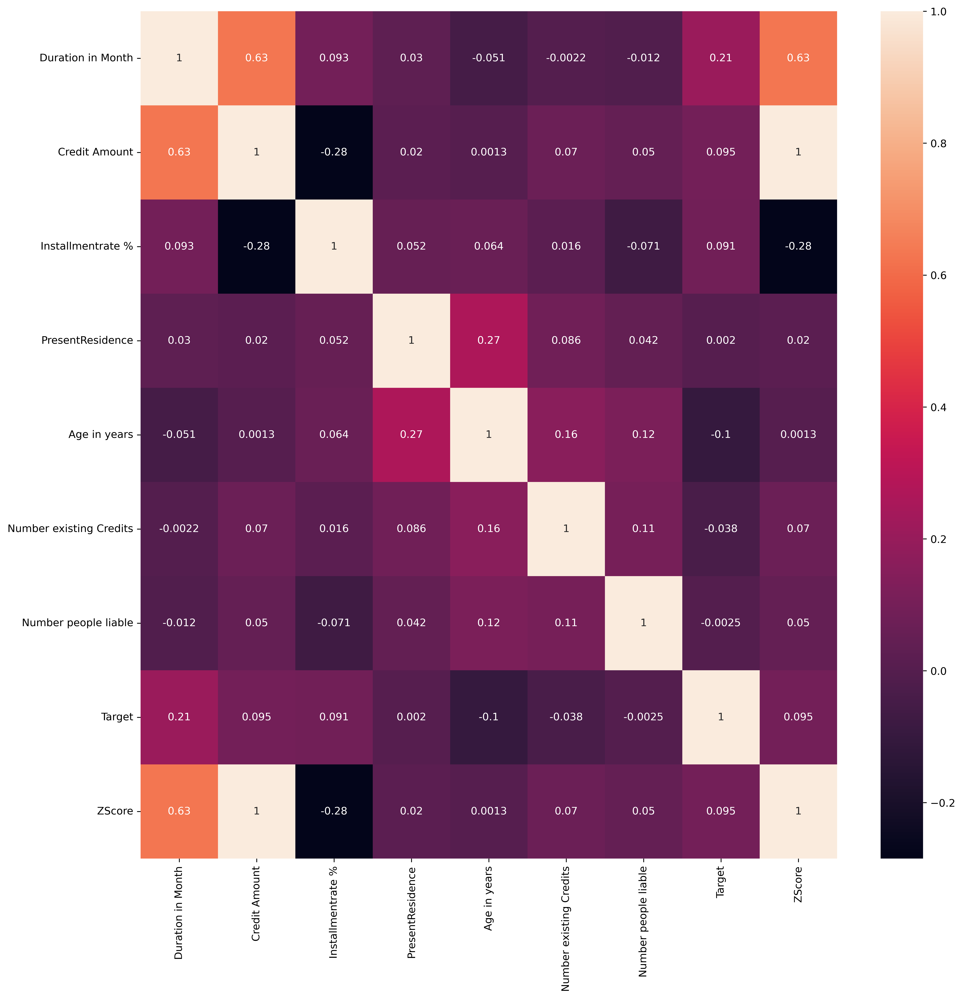

 Positive Correlations:
 Age in years              -0.102881
Number existing Credits   -0.037711
Number people liable      -0.002542
PresentResidence           0.002026
Installmentrate %          0.090789
Credit Amount              0.095059
ZScore                     0.095059
Duration in Month          0.209708
Target                     1.000000
Name: Target, dtype: float64
 Negative Correlations:
 Age in years              -0.102881
Number existing Credits   -0.037711
Number people liable      -0.002542
PresentResidence           0.002026
Installmentrate %          0.090789
Credit Amount              0.095059
ZScore                     0.095059
Duration in Month          0.209708
Target                     1.000000
Name: Target, dtype: float64


In [25]:
# function to calculate correlation between target and feautures 
# only plot the 5 most correlated features with target variable

def correlation_matrix(df):
    corr_matrix = df.corr()
    plt.figure(figsize=(15,15), dpi = 480)
    sns.heatmap(corr_matrix, annot=True)
    plt.show()

    correlations = df.corr()['Target'].sort_values()

    # Display correlations
    print(' Positive Correlations:\n', correlations)
    print(' Negative Correlations:\n', correlations)
    plt.figure(figsize=(25,25), dpi = 480)
    df.corr()['Target'].sort_values(ascending = False).plot(kind='bar')

correlation_matrix(german_data)

Die Ergebnisse der Korrelationsanalyse bestätigen dass die Kredithöhe linear mit der Kreditlaufzeit korreliert.

In [26]:
#iterate through feautures and get datatype and check if they are categorical or numerical and store them into list for one hot encoding

categorical_features = []
numerical_features = []
for i in german_data.columns:
    print(i, german_data[i].dtype)
    if german_data[i].dtype == 'object':
        print(i, german_data[i].dtype)
        categorical_features.append(i)
    else:
        print(i, german_data[i].dtype)
        numerical_features.append(i)


print(categorical_features, "Numerical:" ,numerical_features)

Status Checking object
Status Checking object
Duration in Month int64
Duration in Month int64
Credit History object
Credit History object
Purpose object
Purpose object
Credit Amount int64
Credit Amount int64
Savings Account object
Savings Account object
Employement since object
Employement since object
Installmentrate % int64
Installmentrate % int64
StatusSex object
StatusSex object
Other debtors object
Other debtors object
PresentResidence int64
PresentResidence int64
Property object
Property object
Age in years int64
Age in years int64
Otherinstallment Plans object
Otherinstallment Plans object
Housing object
Housing object
Number existing Credits int64
Number existing Credits int64
Job object
Job object
Number people liable int64
Number people liable int64
Telephone object
Telephone object
Foreign Worker object
Foreign Worker object
Target int64
Target int64
ZScore float64
ZScore float64
['Status Checking', 'Credit History', 'Purpose', 'Savings Account', 'Employement since', 'Status

### Stark Korrelation zwischen Credit Amount und Duration in Month --> Macht Sinn, da größere Kredite in der Regel längere Laufzeiten haben

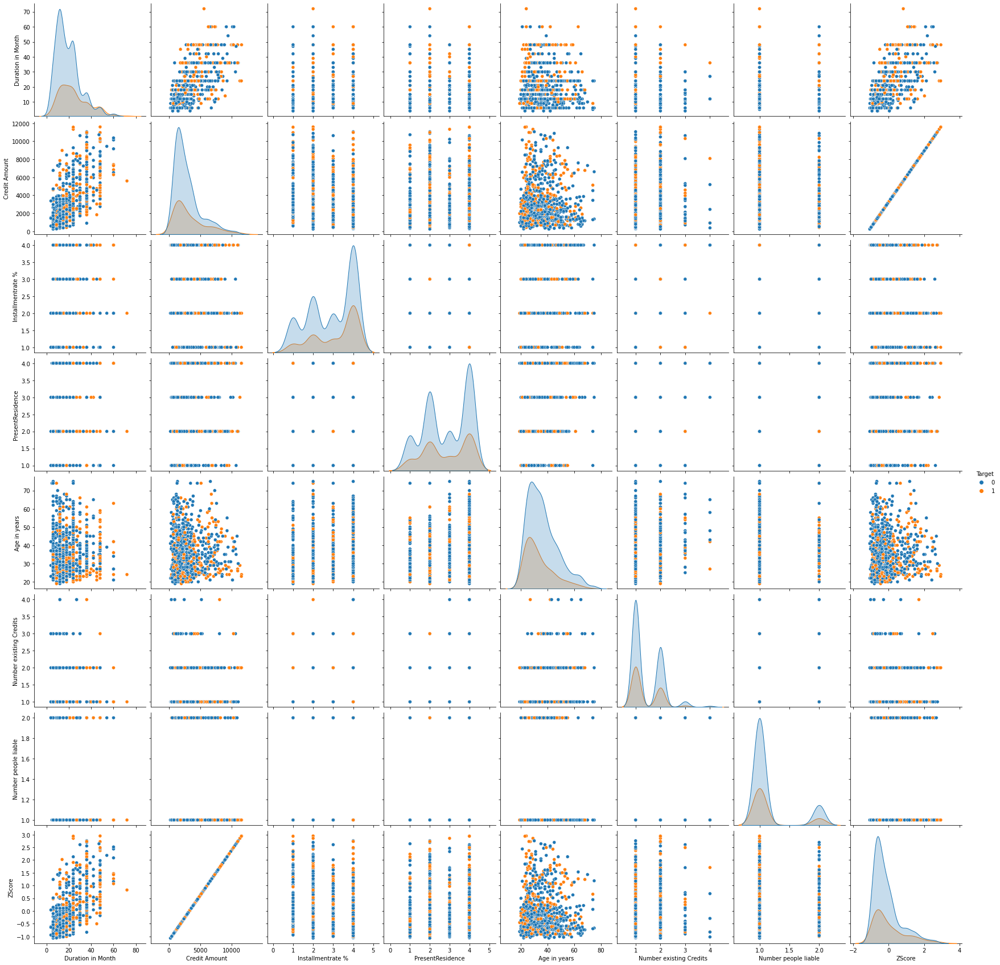

In [27]:
# pairplot um einen überblick über die Verteilung zu bekommen
sns.pairplot(german_data, hue='Target', size=3)


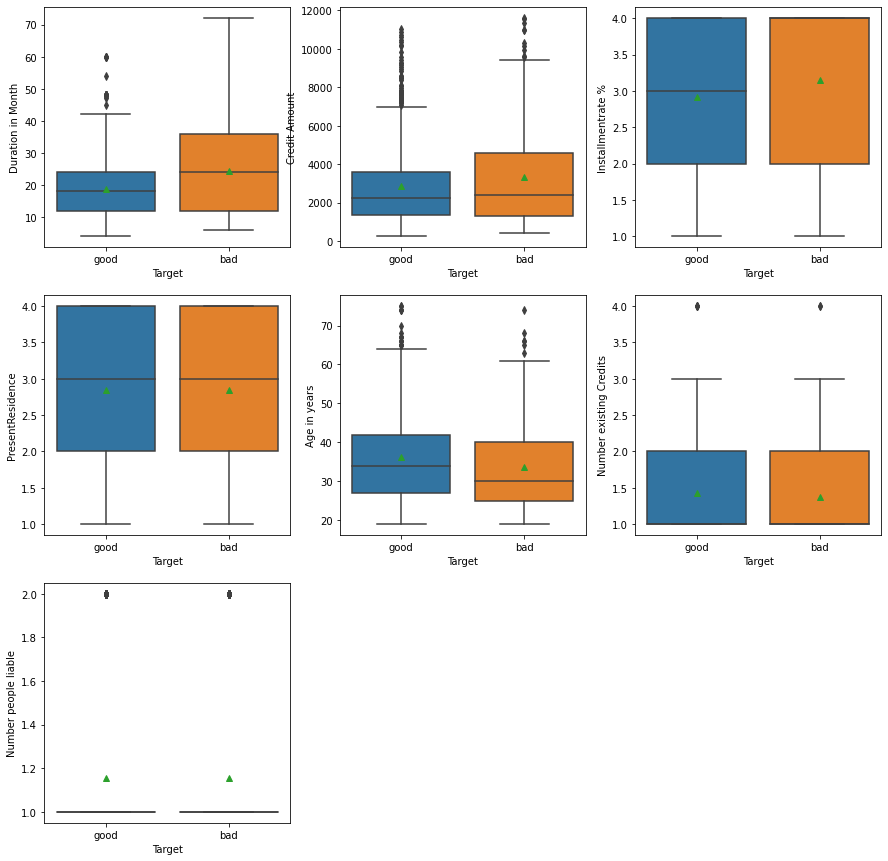

In [28]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))

i = 0
j = 0

for category in numerical_features:
    sns.boxplot(y=german_data[category], x=german_data["Target"].replace({0:"good", 1:"bad"}), ax=axs[i, j], orient="v", showmeans=True)
    j += 1
    if j%3 == 0:
        j = 0
        i += 1
        
axs[2, 1].set_visible(True)
fig.delaxes(axs[2, 1])
axs[2, 2].set_visible(True)
fig.delaxes(axs[2, 2])

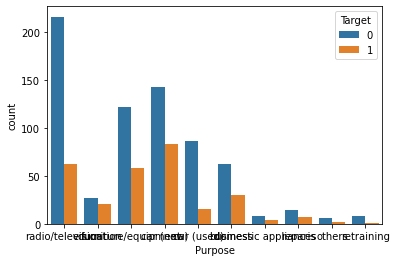

In [29]:
# functio to plot plotbar for categorical features 
def plot_bar(df, feature):
    sns.countplot(x=feature, data=df, hue='Target')
    plt.show()

plot_bar(german_data, 'Purpose')

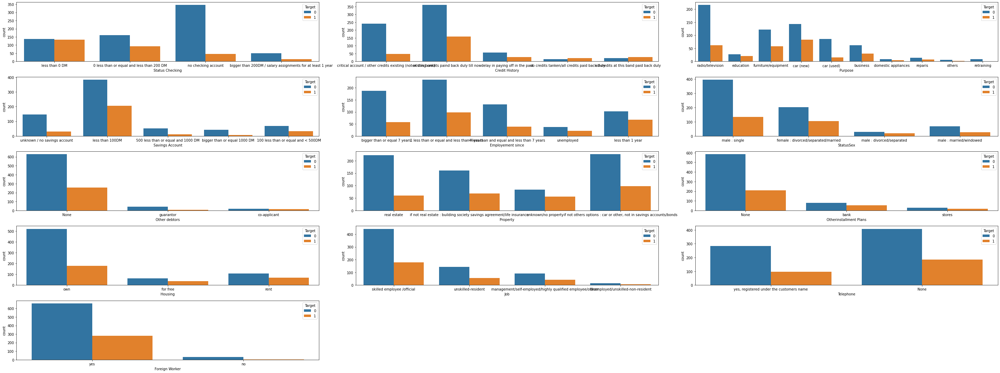

In [30]:
plt.figure(figsize=(40, 15))
for i in range(0, len(categorical_features)):
    plt.subplot(5, 3, i+1)
    sns.countplot(x = german_data[categorical_features[i]], orient='v', hue=german_data['Target'])
    plt.tight_layout()

Text(0.5, 1.0, 'Number of Customers by their duration')

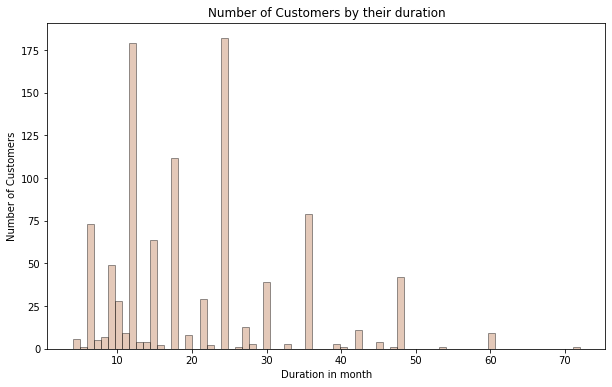

In [31]:
from matplotlib.pyplot import figure
figure(figsize=(10,6))
ax = sns.distplot(german_data['Duration in Month'], hist=True, kde=False, 
             bins=72, color = '#bd7a51', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
ax.set_ylabel('Number of Customers')
ax.set_xlabel('Duration in month')
ax.set_title('Number of Customers by their duration')

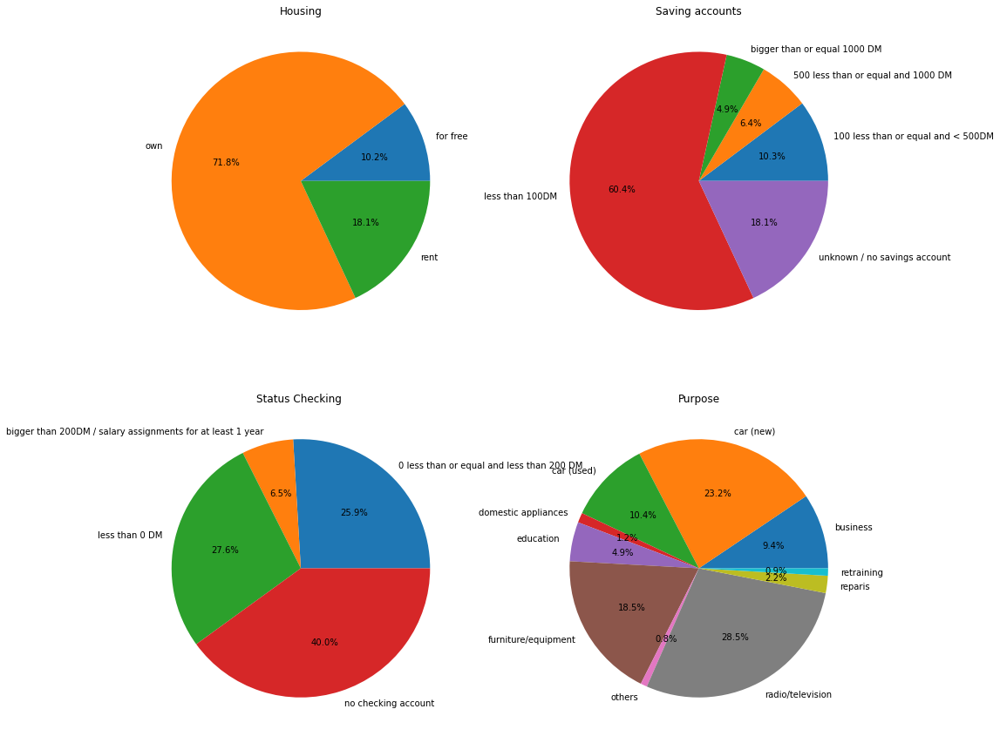

In [32]:
data_Housing = german_data.groupby('Housing')['Housing'].count()
data_Savingaccounts = german_data.groupby('Savings Account')['Savings Account'].count()
data_Checkingaccount = german_data.groupby('Status Checking')['Status Checking'].count()
data_Purpose = german_data.groupby('Purpose')['Purpose'].count()

data_Housing = pd.DataFrame({'Housing':data_Housing.index, 'Count':data_Housing.values})
data_Savingaccounts = pd.DataFrame({'Savings Account':data_Savingaccounts.index, 'Count':data_Savingaccounts.values})
data_Checkingaccount = pd.DataFrame({'Status Checking':data_Checkingaccount.index, 'Count':data_Checkingaccount.values})
data_Purpose = pd.DataFrame({'Purpose':data_Purpose.index, 'Count':data_Purpose.values})

fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(data_Housing['Count'],labels = data_Housing['Housing'],autopct='%1.1f%%');
plt.title('Housing');

ax1 = plt.subplot2grid((2,2),(0,1))
plt.pie(data_Savingaccounts['Count'],labels = data_Savingaccounts['Savings Account'],autopct='%1.1f%%');
plt.title('Saving accounts');

ax1 = plt.subplot2grid((2,2),(1,0))
plt.pie(data_Checkingaccount['Count'],labels = data_Checkingaccount['Status Checking'],autopct='%1.1f%%');
plt.title('Status Checking ');

ax1 = plt.subplot2grid((2,2),(1,1))
plt.pie(data_Purpose['Count'],labels = data_Purpose['Purpose'],autopct='%1.1f%%');
plt.title('Purpose');

In [33]:
german_data


,Status Checking,Duration in Month,Credit History,Purpose,Credit Amount,Savings Account,Employement since,Installmentrate %,StatusSex,Other debtors,...,Age in years,Otherinstallment Plans,Housing,Number existing Credits,Job,Number people liable,Telephone,Foreign Worker,Target,ZScore
0,less than 0 DM,6,critical account / other credits existing (not...,radio/television,1169,unknown / no savings account,bigger than or equal 7 years,4,male : single,None,...,67,None,own,2,skilled employee /official,1,"yes, registered under the customers name",yes,0,-0.744759
1,0 less than or equal and less than 200 DM,48,existing credits paind back duly till now,radio/television,5951,less than 100DM,1 less than or equal and less than 4 years,2,female : divorced/separated/married,None,...,22,None,own,1,skilled employee /official,1,None,yes,1,0.949342
2,no checking account,12,critical account / other credits existing (not...,education,2096,less than 100DM,4 less than and equal and less than 7 years,2,male : single,None,...,49,None,own,1,unskilled-resident,2,None,yes,0,-0.416354
3,less than 0 DM,42,existing credits paind back duly till now,furniture/equipment,7882,less than 100DM,4 less than and equal and less than 7 years,2,male : single,guarantor,...,45,None,for free,1,skilled employee /official,2,None,yes,0,1.633430
4,less than 0 DM,24,delay in paying off in the past,car (new),4870,less than 100DM,1 less than or equal and less than 4 years,3,male : single,None,...,53,None,for free,2,skilled employee /official,2,None,yes,1,0.566380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,no checking account,12,existing credits paind back duly till now,furniture/equipment,1736,less than 100DM,4 less than and equal and less than 7 years,3,female : divorced/separated/married,None,...,31,None,own,1,unskilled-resident,1,None,yes,0,-0.543890
996,less than 0 DM,30,existing credits paind back duly till now,car (used),3857,less than 100DM,1 less than or equal and less than 4 years,4,male : divorced/separated,None,...,40,None,own,1,management/self-employed/highly qualified empl...,1,"yes, registered under the customers name",yes,0,0.207509
997,no checking account,12,existing credits paind back duly till now,radio/television,804,less than 100DM,bigger than or equal 7 years,4,male : single,None,...,38,None,own,1,skilled employee /official,1,None,yes,0,-0.874066
998,less than 0 DM,45,existing credits paind back duly till now,radio/television,1845,less than 100DM,1 less than or equal and less than 4 years,4,male : single,None,...,23,None,for free,1,skilled employee /official,1,"yes, registered under the customers name",yes,1,-0.505275


# Feauture Engineering

In [34]:
# since there is some correlation between credit amount and  duration in months we create a new feature
# credit amount divided by duration in months 
german_data['Credit Amount per Month'] = german_data['Credit Amount'] / german_data['Duration in Month']

# drop the duration in month feature and credit amount feature

german_data.drop(['Duration in Month', 'Credit Amount'], axis=1, inplace=True)

In [35]:
# split column StatusSex by delimiter ":"
#german_data['StatusSex'] = german_data['StatusSex'].str.split(":", n=-1, expand=False)
# create new column for Status
#german_data['Sex'] = german_data['StatusSex'].str.get(0)
#german_data['Status'] = german_data['StatusSex'].str.get(1)

# drop column StatusSex

#german_data = german_data.drop(columns="StatusSex", axis = 1)

# One Hot Encoding

In [36]:
#iterate through feautures and get datatype and check if they are categorical or numerical and store them into list for one hot encoding

categorical_features = []
numerical_features = []
for i in german_data.columns:
    print(i, german_data[i].dtype)
    if german_data[i].dtype == 'object':
        print(i, german_data[i].dtype)
        categorical_features.append(i)
    else:
        print(i, german_data[i].dtype)
        numerical_features.append(i)


print(categorical_features, "Numerical:" ,numerical_features)
    

Status Checking object
Status Checking object
Credit History object
Credit History object
Purpose object
Purpose object
Savings Account object
Savings Account object
Employement since object
Employement since object
Installmentrate % int64
Installmentrate % int64
StatusSex object
StatusSex object
Other debtors object
Other debtors object
PresentResidence int64
PresentResidence int64
Property object
Property object
Age in years int64
Age in years int64
Otherinstallment Plans object
Otherinstallment Plans object
Housing object
Housing object
Number existing Credits int64
Number existing Credits int64
Job object
Job object
Number people liable int64
Number people liable int64
Telephone object
Telephone object
Foreign Worker object
Foreign Worker object
Target int64
Target int64
ZScore float64
ZScore float64
Credit Amount per Month float64
Credit Amount per Month float64
['Status Checking', 'Credit History', 'Purpose', 'Savings Account', 'Employement since', 'StatusSex', 'Other debtors', '

In [37]:
# one hot encode categorical features
german_data = pd.get_dummies(german_data, columns=categorical_features)

german_data

,Installmentrate %,PresentResidence,Age in years,Number existing Credits,Number people liable,Target,ZScore,Credit Amount per Month,Status Checking_0 less than or equal and less than 200 DM,Status Checking_bigger than 200DM / salary assignments for at least 1 year,...,Housing_own,Housing_rent,Job_management/self-employed/highly qualified employee/officer,Job_skilled employee /official,Job_unemployed/unskilled-non-resident,Job_unskilled-resident,Telephone_None,"Telephone_yes, registered under the customers name",Foreign Worker_no,Foreign Worker_yes
0,4,4,67,2,1,0,-0.744759,194.833333,0,0,...,1,0,0,1,0,0,0,1,0,1
1,2,2,22,1,1,1,0.949342,123.979167,1,0,...,1,0,0,1,0,0,1,0,0,1
2,2,3,49,1,2,0,-0.416354,174.666667,0,0,...,1,0,0,0,0,1,1,0,0,1
3,2,4,45,1,2,0,1.633430,187.666667,0,0,...,0,0,0,1,0,0,1,0,0,1
4,3,4,53,2,2,1,0.566380,202.916667,0,0,...,0,0,0,1,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,4,31,1,1,0,-0.543890,144.666667,0,0,...,1,0,0,0,0,1,1,0,0,1
996,4,4,40,1,1,0,0.207509,128.566667,0,0,...,1,0,1,0,0,0,0,1,0,1
997,4,4,38,1,1,0,-0.874066,67.000000,0,0,...,1,0,0,1,0,0,1,0,0,1
998,4,4,23,1,1,1,-0.505275,41.000000,0,0,...,0,0,0,1,0,0,0,1,0,1


In [38]:
# still 1000 rows but 61 columns after one hot encoding
german_data.shape

(975, 62)

In [39]:
# correlation after one hot encoding

corr = correlation_matrix(german_data)

corr

 Positive Correlations:
 Status Checking_no checking account                                           -0.314581
Credit History_critical account / other credits existing (not at this bank)   -0.177562
Savings Account_unknown / no savings account                                  -0.129756
Housing_own                                                                   -0.126442
Otherinstallment Plans_None                                                   -0.118930
                                                                                 ...   
Credit History_no credits tanken/all credits paid back duly                    0.131683
Credit History_all credits at this band paid back duly                         0.140921
Savings Account_less than 100DM                                                0.157284
Status Checking_less than 0 DM                                                 0.272608
Target                                                                         1.000000
Name: T

In [40]:
#drop zscore
german_data = german_data.drop(['ZScore'], axis=1)


In [41]:
#german_data.to_csv('german_data_cleaned.csv', index=False)

# Helper Functions


In [42]:
#plot roc curve
from sklearn.metrics import roc_curve, auc
#plot roc curve
def plot_roc_curve(y_test, y_pred,label):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic: '+label)
    plt.legend(loc="lower right")
    plt.show()



In [43]:
# plot confusion matrix function
def plot_confusion_matrix(y_test, y_pred, label):
    cm = confusion_matrix(y_test.tolist(), y_pred.tolist())
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap="Blues")
    plt.title('Confusion Matrix: '+label)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()


In [44]:
# function for metrics
def metrics(X,y,y_test, y_pred, modell = None, crossval = True):


    print("----- Metric for 80/20 Split -----")
    print("Accuracy score:", accuracy_score(y_test, y_pred))
    print("Recall score:", recall_score(y_test, y_pred))
    print("Precision score:", precision_score(y_test, y_pred))
    print("fbeta score:", fbeta_score(y_test, y_pred, beta=2))
    print("----- Metric for Cross Validation -----")

    if crossval == True:
        modell.fit(X,y)
        
        print("Crossval score:", statistics.mean(cross_val_score(modell ,X, y, scoring=f2,cv = cv )))
        # print all the scores
        print("Crossval score:", cross_val_score(modell ,X, y, scoring=f2,cv = cv ))


In [45]:
# append metrics to dictionary
def metrics_dict_non_opt(y_test, y_pred, label, modell = None):
    Non_opt_results["Algo_name"].append(label)
    Non_opt_results["Recall"].append(recall_score(y_test, y_pred))
    Non_opt_results["Precision"].append(precision_score(y_test, y_pred))
    Non_opt_results["Accuracy"].append(accuracy_score(y_test, y_pred))
    Non_opt_results["F2"].append(fbeta_score(y_test, y_pred,beta=2))
    Non_opt_results["F2-CV"].append(statistics.mean(cross_val_score(modell ,X, y, scoring=f2,cv = cv )))


def metrics_dict_opt(y_test, y_pred, label, modell = None):
    Opt_results["Algo_name"].append(label)
    Opt_results["Recall"].append(recall_score(y_test, y_pred))
    Opt_results["Precision"].append(precision_score(y_test, y_pred))
    Opt_results["Accuracy"].append(accuracy_score(y_test, y_pred))
    Opt_results["F2"].append(fbeta_score(y_test, y_pred,beta=2))
    Opt_results["F2-CV"].append(statistics.mean(cross_val_score(modell ,X, y, scoring=f2,cv = cv )))

In [46]:
def f2_measure(y_true, y_pred):
	return fbeta_score(y_true, y_pred, beta=2)
f2 = make_scorer(f2_measure)

# Split Feauture und Target

In [47]:
# split features and target
X = german_data.drop(['Target'], axis=1)
y = german_data['Target']

In [48]:

# Kreuzvalidierung
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)

# Basic Modelling with Logistic Regression as Baseline, xGboost and a neuronal Network

In [49]:
# create dictionary with algo names and score metrics for later analysis

Non_opt_results = {"Algo_name": [], "Recall": [],"Precision": [],"Accuracy": [], "F2": [], "F2-CV": []}

In [50]:
# split data into train and test set 80/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [54]:
# use logistic regression to predict target variable
# create logistic regression model with standard parameters

def logistic_regression(X_train, X_test, y_train, y_test):
    logreg = LogisticRegression(random_state=42, class_weight='balanced')
    # fit the model
    logreg.fit(X_train, y_train)
    # predict the target variable
    y_pred = logreg.predict(X_test)

    # print accuracy score and recall score
    metrics(X,y,y_test, y_pred, crossval=True, modell=logreg)



    # add algo name and recall score to dictionary
    metrics_dict_non_opt(y_test, y_pred, "Logistic Regression", logreg)





In [55]:
logistic_regression(X_train, X_test, y_train, y_test)

----- Metric for 80/20 Split -----
Accuracy score: 0.7076923076923077
Recall score: 0.7931034482758621
Precision score: 0.5054945054945055
fbeta score: 0.7120743034055728
----- Metric for Cross Validation -----
Crossval score: 0.6317596598210686
Crossval score: [0.64935065 0.63517915 0.63934426 0.60606061 0.67961165 0.67307692
 0.64935065 0.61258278 0.60064935 0.57239057]


In [52]:
plot_roc_curve(y_test, y_pred,"Logistic Regression")

NameError: name 'y_pred' is not defined

In [ ]:
plot_confusion_matrix(y_test,y_pred,"Logistic Regression")


In [ ]:
# use random forest to predict target variable
# fit the model
rf = RandomForestClassifier( random_state=42)
rf.fit(X_train, y_train)
# predict the target variable
y_pred = rf.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=rf)


metrics_dict_non_opt(y_test, y_pred, "Random forest", rf)



In [ ]:
# show feature importance for random forest
importances = rf.feature_importances_
# plot importances
plt.figure(figsize=(10,10))
# order importances
indices = np.argsort(importances)[::-1]
sns.barplot(x=importances[indices], y=X_train.columns, orient='h')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance')
plt.show()



plot_roc_curve(y_test, y_pred,"Random Forest")

In [ ]:
plot_confusion_matrix(y_test,y_pred,"Random Forest")


In [ ]:
# use neuro network to predict target variable
# als baseline werden die Standardparameter verwendet
# normalisieren
# fit the model
nn = MLPClassifier(hidden_layer_sizes=(100), random_state=42)
nn.fit(X_train, y_train)
# predict the target variable
y_pred = nn.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=nn)


metrics_dict_non_opt(y_test, y_pred, "Neural Network", nn)


In [ ]:
plot_roc_curve(y_test, y_pred,"Neural Network")

In [ ]:
plot_confusion_matrix(y_test,y_pred,"Neural Network")


In [ ]:
# use xgboost to predict target variable

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

X_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_train.columns.values]
X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X.columns.values]

# fit the model
xgb = XGBClassifier(random_state=42)


xgb.fit(X_train, y_train)
# predict the target variable
y_pred = xgb.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=xgb)


metrics_dict_non_opt(y_test, y_pred, "xGboost", xgb)



In [ ]:
plot_roc_curve(y_test, y_pred,"xGboost")

In [ ]:
plot_confusion_matrix(y_test,y_pred,"xGboost")



# Ergebnisse nicht Optimierte Modelle


In [ ]:
Non_opt_results

# Modells Optimized with Hyperparametertuning
## Logistic Regression

In [ ]:
# dictionary for hypertuned modells
Opt_results = {"Algo_name": [], "Recall": [],"Precision": [],"Accuracy": [], "F2": [], "F2-CV": []}

In [ ]:
#hyperparameter tuning for logistic regression
#tune hyperparameters
parameters = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'penalty': ['l1', 'l2'],'intercept_scaling': [100, 500, 1000, 5000, 10000], 'class_weight': ["balanced", None]}
# create grid search object with cross validation
grid_search = GridSearchCV(logreg, parameters, cv=cv, scoring=f2)
# fit the model
grid_search.fit(X_train, y_train)
# print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# save best hyperparameters in variable
logreg_best_parameters = grid_search.best_params_


In [ ]:
# create the model with the best hyperparameters
'''
solver to liblinear --> better score; standard lbfgs
'''
logreg = LogisticRegression(random_state=42,class_weight= logreg_best_parameters['class_weight'] ,C=logreg_best_parameters['C'], penalty=logreg_best_parameters['penalty'], intercept_scaling=logreg_best_parameters['intercept_scaling'], solver = 'liblinear' )
# fit the model
logreg.fit(X_train, y_train)
# predict the target variable
y_pred = logreg.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=logreg)



In [ ]:
plot_confusion_matrix(y_test,y_pred,"Logistic Regression Optimized")

In [ ]:
metrics_dict_opt(y_test, y_pred, "Logistic regression", logreg)

# Random Forest

In [ ]:
# grid search parameters for random forest
parameters = {'n_estimators': [10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'sqrt', 'log2'],'max_depth': [None, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]}
# create grid search object with cross validation
grid_search = GridSearchCV(rf, parameters, cv=cv, scoring=f2)
# fit the model
grid_search.fit(X_train, y_train)
# print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

rf_best_parameters = grid_search.best_params_



In [ ]:
# create the model with the best hyperparameters
rf = RandomForestClassifier(n_estimators=rf_best_parameters['n_estimators'], max_features=rf_best_parameters['max_features'], max_depth=rf_best_parameters['max_depth'])
# fit the model
rf.fit(X_train, y_train)
# predict the target variable
y_pred = rf.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=rf)



In [ ]:
# append the results to the dictionary
metrics_dict_opt(y_test, y_pred, "Random Forest", rf)


# xGboost

In [ ]:
# tune hyperparameters for xgboost
parameters = {'n_estimators': [10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20], 'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}
# create grid search object with cross validation
grid_search = GridSearchCV(xgb, parameters, cv=cv, scoring=f2)
# fit the model
grid_search.fit(X_train, y_train)
# print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)
xgb_best_parameters = grid_search.best_params_




In [ ]:
# create the model with the best hyperparameters
xgb = XGBClassifier(n_estimators=xgb_best_parameters['n_estimators'], max_depth=xgb_best_parameters['max_depth'], learning_rate=xgb_best_parameters['learning_rate'])
# fit the model
xgb.fit(X_train, y_train)
# predict the target variable
y_pred = xgb.predict(X_test)
# print accuracy score and recall score

metrics(X,y,y_test, y_pred, crossval=True, modell=xgb)



In [ ]:
plot_roc_curve(y_test, y_pred, "xGboost Opt")

In [ ]:
# append the results to the dictionary
metrics_dict_opt(y_test, y_pred, "xGboost", xgb)


In [ ]:
Opt_results

In [ ]:
Non_opt_results


# Neuronal Network

In [ ]:
# tune hyperparameters for neural network
parameters = {'hidden_layer_sizes': [(15,)],'activation': ['logistic'],'solver': ['lbfgs', 'sgd', 'adam'], 'max_iter': [100], 'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0], 'learning_rate': ['constant', 'invscaling', 'adaptive'], 'learning_rate_init': [0.0001, 0.001, 0.01, 0.1], 'power_t': [0.5, 0.75, 0.9], 'shuffle': [True, False]}
# create grid search object with cross validation
grid_search = GridSearchCV(nn, parameters, cv=cv, scoring=f2)
# fit the model
grid_search.fit(X_train, y_train)
# print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

nn_best_parameters = grid_search.best_params_

In [ ]:
# create the model with the best hyperparameters
nn = MLPClassifier(hidden_layer_sizes=nn_best_parameters['hidden_layer_sizes'], activation=nn_best_parameters['activation'], solver=nn_best_parameters['solver'], max_iter=nn_best_parameters['max_iter'], alpha=nn_best_parameters['alpha'], learning_rate=nn_best_parameters['learning_rate'], learning_rate_init=nn_best_parameters['learning_rate_init'], power_t=nn_best_parameters['power_t'], shuffle=nn_best_parameters['shuffle'])
# fit the model
nn.fit(X_train, y_train)
# predict the target variable
y_pred = nn.predict(X_test)
# print accuracy score and recall score
metrics(X,y,y_test, y_pred, crossval=True, modell=nn)



In [ ]:

# plot roc curve

plot_roc_curve(y_test, y_pred, "NN Opt")

In [ ]:
metrics_dict_opt(y_test, y_pred, "Neuronal Network", nn)

In [ ]:
# delete 3rd column from dictionary

Opt_results

In [ ]:
# Opt_results to excel file
Opt_results = pd.DataFrame(Opt_results)
Opt_results
Opt_results.to_csv("Opt_opt_results.csv", index=False)

In [ ]:
# Non_opt_results to excel file
Non_opt_results = pd.DataFrame(Non_opt_results)

Non_opt_results

In [ ]:
# export nonopt to csv
Non_opt_results.to_csv("Non_opt_results.csv", index=False)
Opt_results.to_csv("Non_opt_results.csv", index=False)


# Hyperopt Hyperparametertuning

# Kreuzvalidierung

In [ ]:
# create stratified kfold object
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
# create empty list to store recall scores
f2_scores = []
# perform stratified kfold cross validation
for train, test in kfold.split(X, y):
    # create model
    rf = RandomForestClassifier(random_state=42)

    # fit model
    rf.fit(X.iloc[train], y.iloc[train])
    # predict on test set
    y_pred = rf.predict(X.iloc[test])
    # append recall score to list
    f2_scores.append(fbeta_score(y.iloc[test], y_pred, beta = 2))
    # print recall score
    print("F2 score:", fbeta_score(y.iloc[test], y_pred, beta = 2))
# print mean recall score
print("Mean F2 score:", statistics.mean(f2_scores))

In [ ]:
# create stratified kfold object
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
# create empty list to store recall scores
f2_scores = []

for train_index, test_index in kfold.split(X,y):
    X_train = X.iloc[train_index]
    y_train = y.iloc[train_index]  # Based on your code, you might need a ravel call here, but I would look into how you're generating your y
    X_test = X.iloc[test_index]
    y_test = y.iloc[test_index]  # See comment on ravel and  y_train
    sm = SMOTE(sampling_strategy="auto",random_state=42)
    X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    model =  LogisticRegression(random_state=42,class_weight='balanced',C=logreg_best_parameters['C'], penalty=logreg_best_parameters['penalty'], intercept_scaling=logreg_best_parameters['intercept_scaling'], solver = 'liblinear' )  # Choose a model here
    model.fit(X_train_oversampled, y_train_oversampled )  
    y_pred = model.predict(X_test)
    print(f'f-score: {fbeta_score(y_test, y_pred, beta = 2)}')
    f2_scores.append(fbeta_score(y_test, y_pred, beta = 2))
print(f'Mean f-score: {statistics.mean(f2_scores)}')

In [ ]:
# spot check machine learning algorithms on the german credit dataset
from numpy import mean
from numpy import std
from pandas import read_csv
from matplotlib import pyplot
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import fbeta_score
from sklearn.metrics import make_scorer
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.svm import SVC

In [ ]:
from imblearn.pipeline import Pipeline



model = LogisticRegression(solver='liblinear', class_weight='balanced')

# scale, then undersample, then fit model
pipeline = Pipeline(steps=[('t'), ('s', model), ('m',model)])
# evaluate the model and store results
scores = cross_val_score(pipeline, X, y, scoring=f2, cv=cv)

In [ ]:
scores = cross_val_score(pipeline, X, y, scoring=f2, cv=cv)
scores

In [ ]:
from sklearn.model_selection import cross_val_score

# Running 10-Fold Cross validation on a given algorithmd
# Passing full data X and y because the K-fold will split the data and automatically choose train/test
Accuracy_Values=cross_val_score(logreg, X , y, cv=10, scoring=f2)
print('\nAccuracy values for 10-fold Cross Validation:\n',Accuracy_Values)
print('\nFinal Average Accuracy of the model:', round(Accuracy_Values.mean(),2))

# Oversampling mit Smote

In [ ]:
# oversampling with smote
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE



sm = SMOTE(sampling_strategy="auto",random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(X_train
, y_train
)
# minmax scaler to normalize data 


# create model
logreg = LogisticRegression(random_state=42,class_weight='balanced',C=logreg_best_parameters['C'], penalty=logreg_best_parameters['penalty'], intercept_scaling=logreg_best_parameters['intercept_scaling'], solver = 'liblinear' )
# fit model
logreg.fit(X_train_sm, y_train_sm)
# predict on test set
y_pred = logreg.predict(X_test)
# print accuracy score and recall score
metrics(X_train_sm,y_train_sm, y_test, y_pred, crossval=True, modell=logreg)

# plot roc curve
plot_roc_curve(y_test, y_pred, "Logistic Regression")





In [ ]:
sm = SMOTE(sampling_strategy="auto",random_state=42)
X_train_sm, y_train_sm = sm.fit_resample(X, y)

In [ ]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_sm, y_train_sm)
# predict the target variable
y_pred = rf.predict(X_test)


metrics(X_train_sm,y_train_sm,y_test, y_pred, crossval=True, modell=rf)


In [ ]:
1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
y_test

In [ ]:
regex = re.compile(r"\[|\]|<", re.IGNORECASE)

X_train_sm.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_train_sm.columns.values]

# fit the model
xgb = XGBClassifier(random_state=42)
# fit the model
xgb.fit(X_train_sm, y_train_sm)
# predict the target variable
y_pred = xgb.predict(X_test)
# print accuracy score and recall score

metrics(X_train_sm,y_train_sm,y_test, y_pred, crossval=True, modell=xgb)


plot_roc_curve(y_test, y_pred, "XGBoost")

# Exkursion Explainable AI Algorithmen
Da beim Anwendungsfall der Kreditrisikoanalyse spezielle gesetzliche Vorgaben bestehen, spielt Explainable AI eine immer wichtigere Rolle in diesem Bereich.


Im folgenden soll nun exemplarisch ein Explainable AI Algorithmus für die Vorhersage modelliert werden und den Blackbox-Modellen von oben gegenübergestellt werden.

# Der RIPPER Algorithmus mithilfe der Wittgenstein implementierung

In [ ]:
# import wittgenstein ripper 
from wittgenstein import ripper

# Ideas
- check label encoding vs one hor encoding
- hyperparamter tuning
- use shape for neuronal network
- feauture importance

- Feauture engineering?
- oversampling?


https://optuna.org/